This is my personal implementation of the Vision Transformer (https://arxiv.org/pdf/2010.11929v2.pdf).
This approach uses the original Transformer architecture but applies it to images.

I documented all of my learning process in commits on the 'ViT_dev' branch, and then just merged the final result into 'main' once I was done. If you'd like
to see my struggles, please feel free to checkout ViT_dev and enjoy!

Import packages

In [5]:
import einops
from tqdm.notebook import tqdm

from torchsummary import summary

import time

import torch
from torch import nn
import torchvision
import torch.optim as optim
from torchvision.transforms import Compose, Resize, ToTensor, Normalize, RandomHorizontalFlip, RandomCrop
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models
from torch.utils.data import DataLoader
from tqdm import tqdm

In [6]:
!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
Paths used for configuration of notebook: 
    	/root/.jupyter/nbconfig/notebook.json
Paths used for configuration of notebook: 
    	
      - Validating: OK
Paths used for configuration of notebook: 
    	/root/.jupyter/nbconfig/notebook.json


Set device and hyperparameters of network.

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
BATCH_SIZE = 32
LEARNING_RATE = 1e-4
EPOCHS = 20
NUM_CLASSES = 4  # Change based on your dataset
IMG_SIZE = 224  # ViT expects 224x224 images
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")


Download and prepare dataset. We will use the CIFAR-10 dataset from PyTorch.
The first time you run this, make sure you pass your own 'root' path and use 'download=True' to
download the data. Afterwards, you can change the 'download=True' to 'download=False' since the data is already downloaded.

The cell below used to prepare the CIFAR dataset is taken almost straight from the PyTorch tutorial on training with CIFAR10: https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html

In [9]:
!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Download and unzip dataset
!kaggle datasets download -d lukechugh/best-alzheimer-mri-dataset-99-accuracy
!unzip best-alzheimer-mri-dataset-99-accuracy.zip -d Alzheimer_MRI


Streaming output truncated to the last 5000 lines.
  inflating: Alzheimer_MRI/Combined Dataset/train/No Impairment/NoImpairment (1106).jpg  
  inflating: Alzheimer_MRI/Combined Dataset/train/No Impairment/NoImpairment (1107).jpg  
  inflating: Alzheimer_MRI/Combined Dataset/train/No Impairment/NoImpairment (1108).jpg  
  inflating: Alzheimer_MRI/Combined Dataset/train/No Impairment/NoImpairment (1109).jpg  
  inflating: Alzheimer_MRI/Combined Dataset/train/No Impairment/NoImpairment (111).jpg  
  inflating: Alzheimer_MRI/Combined Dataset/train/No Impairment/NoImpairment (1110).jpg  
  inflating: Alzheimer_MRI/Combined Dataset/train/No Impairment/NoImpairment (1111).jpg  
  inflating: Alzheimer_MRI/Combined Dataset/train/No Impairment/NoImpairment (1112).jpg  
  inflating: Alzheimer_MRI/Combined Dataset/train/No Impairment/NoImpairment (1113).jpg  
  inflating: Alzheimer_MRI/Combined Dataset/train/No Impairment/NoImpairment (1114).jpg  
  inflating: Alzheimer_MRI/Combined Dataset/train/

In [10]:
import os

# Check if folders exist
train_dir = 'Alzheimer_MRI/Combined Dataset/train'
test_dir = 'Alzheimer_MRI/Combined Dataset/test'

print("Train Folder:", os.listdir(train_dir))
print("Test Folder:", os.listdir(test_dir))



Train Folder: ['Mild Impairment', 'Moderate Impairment', 'No Impairment', 'Very Mild Impairment']
Test Folder: ['Mild Impairment', 'Moderate Impairment', 'No Impairment', 'Very Mild Impairment']


In [11]:
train_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = datasets.ImageFolder(root=train_dir, transform=train_transforms)
test_dataset = datasets.ImageFolder(root=test_dir, transform=test_transforms)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=True)

In [12]:
train_dataset.classes

['Mild Impairment',
 'Moderate Impairment',
 'No Impairment',
 'Very Mild Impairment']

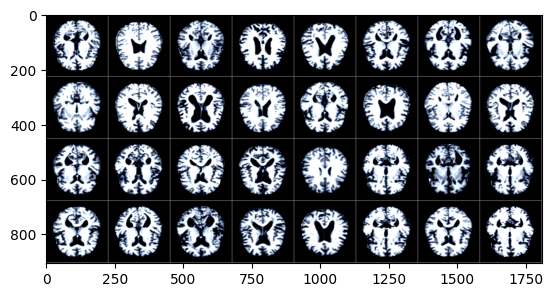

In [13]:
import matplotlib.pyplot as plt
import numpy as np
classes = train_dataset.classes
# functions to show an image
def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

# get some random training images
dataiter = iter(train_loader)
images, labels = next(dataiter)  # (16, 16, 224, 224, 3)

# If the second dimension (16) is a patch size, select the first 16 images:
 # Should be (16, 3, 224, 224)

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
#print(' '.join(f'{classes[labels[j]]:5s}' for j in range(batch_size)))

In [14]:
model = models.vit_b_16(weights=None)  # No pretrained weights
model.heads.head = nn.Linear(in_features=768, out_features=NUM_CLASSES)  # Adjust classifier
model.to(DEVICE)

VisionTransformer(
  (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=3072, out_features=768, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_a

In [15]:
from torch.optim.lr_scheduler import LambdaLR
import math
warmup_epochs=5
total_epochs=EPOCHS
def lr_lambda(epoch):
    if epoch < warmup_epochs:
        return epoch / warmup_epochs
    else:
        return 0.5 * (1 + math.cos((epoch - warmup_epochs) / (total_epochs - warmup_epochs) * math.pi))



In [16]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
scheduler = LambdaLR(optimizer, lr_lambda=lr_lambda)

Training loop.

In [17]:
import matplotlib.pyplot as plt
import torch

def show_predictions(model, dataloader, class_names, device, num_images=10):
    model.eval()  # Set model to evaluation mode
    images, labels = next(iter(dataloader))  # Get a batch of images
    images, labels = images[:num_images].to(device), labels[:num_images].to(device)  # Select first 10

    with torch.no_grad():
        outputs = model(images)  # Get model predictions
        _, preds = torch.max(outputs, 1)  # Get predicted class indices

    # Plot images
    fig, axes = plt.subplots(2, 5, figsize=(15, 6))  # 2 rows, 5 columns
    axes = axes.flatten()

    for i in range(num_images):
        image = images[i].cpu().permute(1, 2, 0).numpy()  # Convert tensor to NumPy array
        axes[i].imshow(image, cmap='gray')
        axes[i].set_title(f"Pred: {class_names[preds[i]]}\nActual: {class_names[labels[i]]}")
        axes[i].axis("off")

    plt.tight_layout()
    plt.show()

# Example usage



Epoch 1/20: 100%|██████████| 320/320 [06:04<00:00,  1.14s/it]


Epoch 1/20:
  LR: 0.000000
  Training Loss: 1.4374, Training Acc: 24.97%
  Testing Loss: 1.3642, Testing Acc: 49.49%


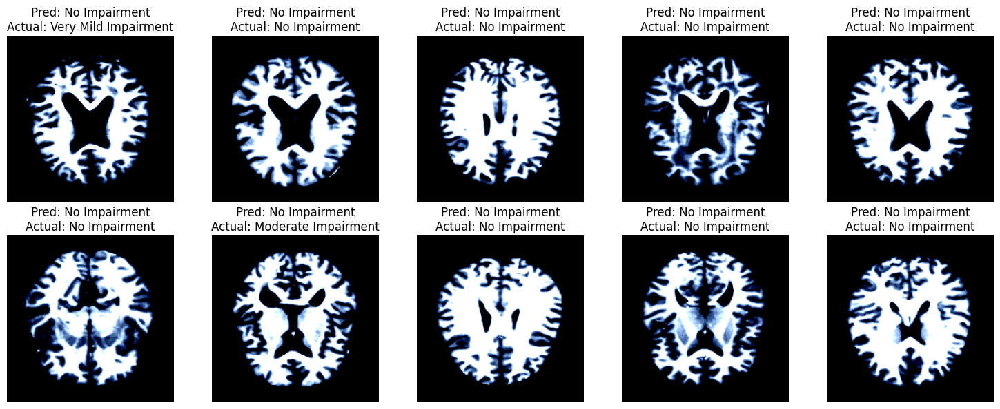

Epoch 2/20: 100%|██████████| 320/320 [06:09<00:00,  1.15s/it]


Epoch 2/20:
  LR: 0.000020
  Training Loss: 1.3348, Training Acc: 48.89%
  Testing Loss: 1.1152, Testing Acc: 45.58%


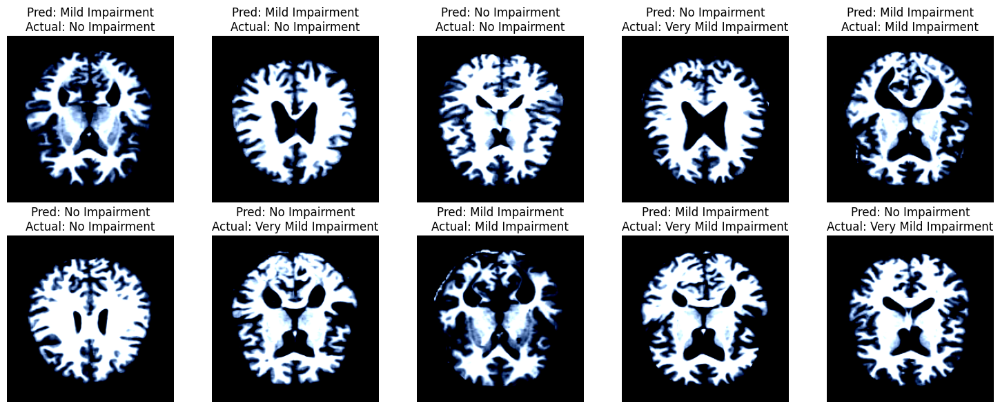

Epoch 3/20: 100%|██████████| 320/320 [06:09<00:00,  1.16s/it]


Epoch 3/20:
  LR: 0.000040
  Training Loss: 0.7733, Training Acc: 69.89%
  Testing Loss: 1.0392, Testing Acc: 42.92%


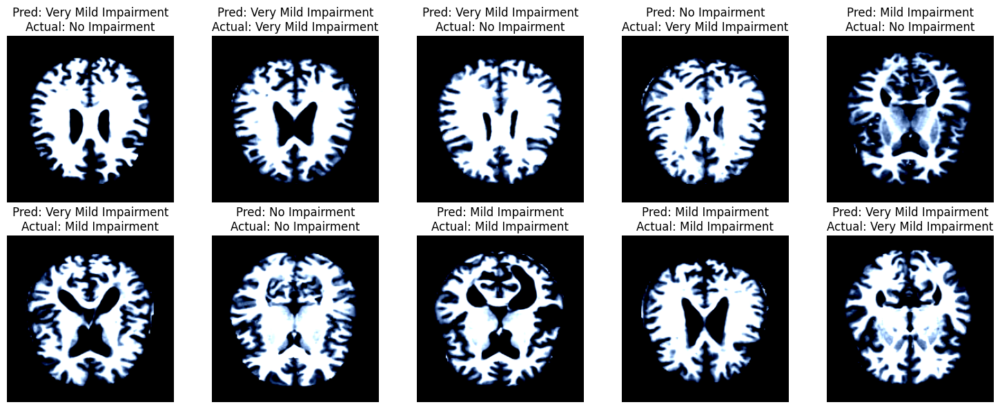

Epoch 4/20: 100%|██████████| 320/320 [06:11<00:00,  1.16s/it]


Epoch 4/20:
  LR: 0.000060
  Training Loss: 0.5584, Training Acc: 79.17%
  Testing Loss: 0.8150, Testing Acc: 59.73%


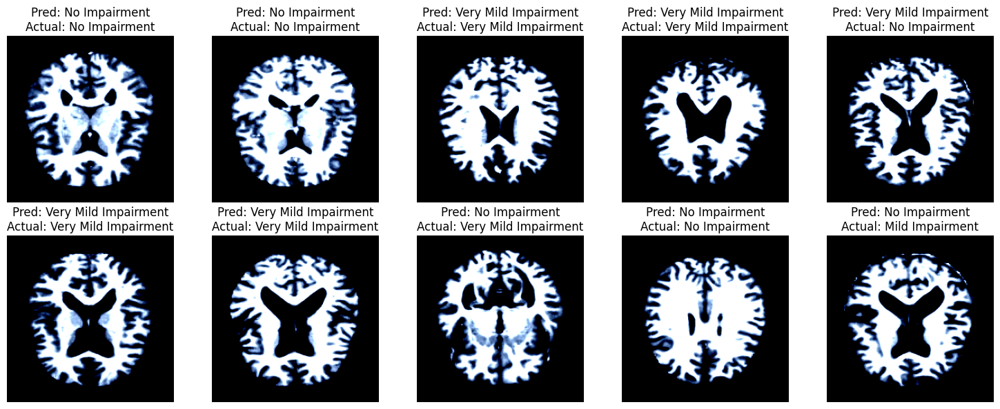

Epoch 5/20: 100%|██████████| 320/320 [06:12<00:00,  1.16s/it]


Epoch 5/20:
  LR: 0.000080
  Training Loss: 0.4788, Training Acc: 82.45%
  Testing Loss: 0.8564, Testing Acc: 58.48%


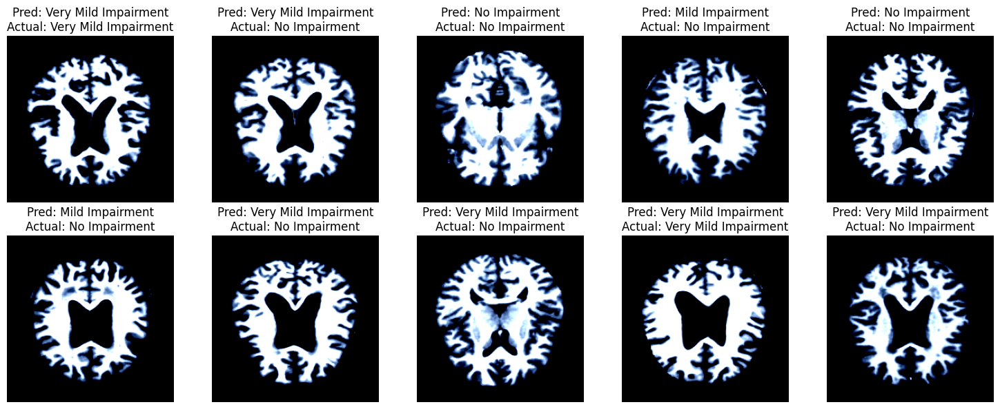

Epoch 6/20: 100%|██████████| 320/320 [06:12<00:00,  1.16s/it]


Epoch 6/20:
  LR: 0.000100
  Training Loss: 0.4210, Training Acc: 86.19%
  Testing Loss: 0.7684, Testing Acc: 65.36%


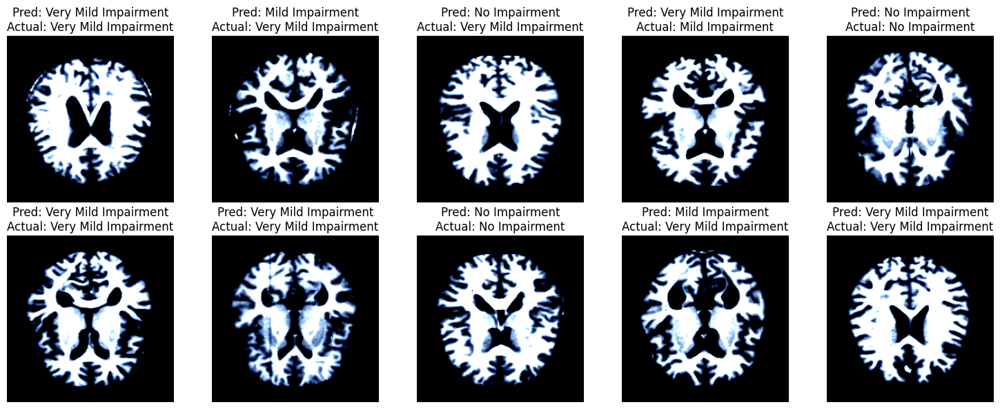

Epoch 7/20: 100%|██████████| 320/320 [06:13<00:00,  1.17s/it]


Epoch 7/20:
  LR: 0.000099
  Training Loss: 0.3461, Training Acc: 90.08%
  Testing Loss: 0.6519, Testing Acc: 71.46%


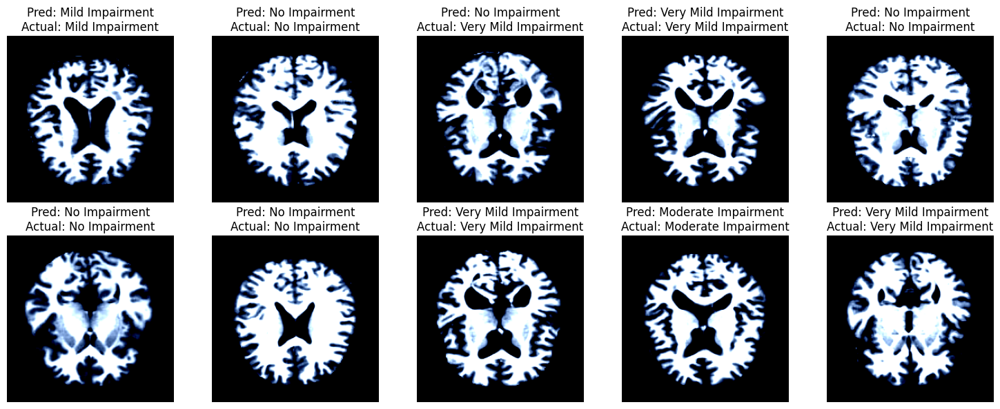

Epoch 8/20: 100%|██████████| 320/320 [06:14<00:00,  1.17s/it]


Epoch 8/20:
  LR: 0.000096
  Training Loss: 0.2776, Training Acc: 92.21%
  Testing Loss: 0.5763, Testing Acc: 75.76%


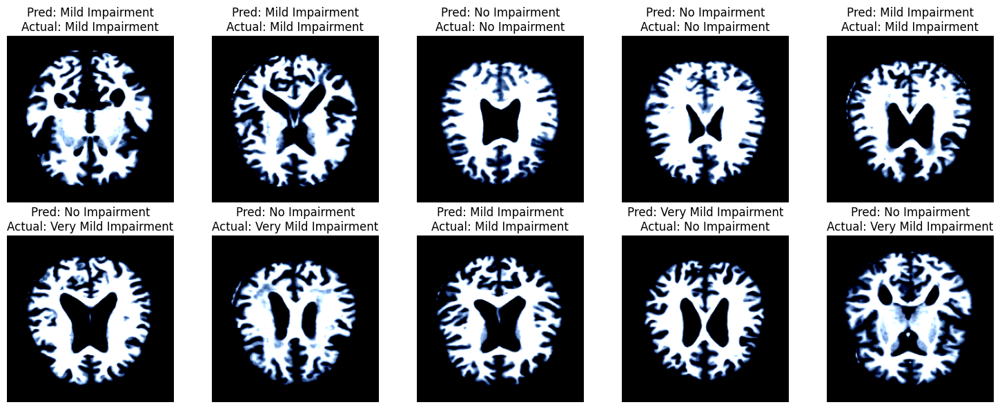

Epoch 9/20: 100%|██████████| 320/320 [06:15<00:00,  1.17s/it]


Epoch 9/20:
  LR: 0.000090
  Training Loss: 0.2486, Training Acc: 91.54%
  Testing Loss: 0.7083, Testing Acc: 69.66%


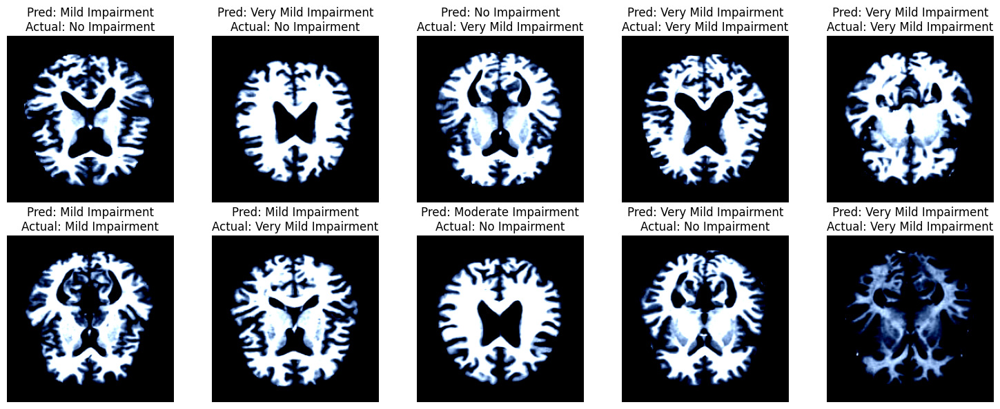

Epoch 10/20: 100%|██████████| 320/320 [06:17<00:00,  1.18s/it]


Epoch 10/20:
  LR: 0.000083
  Training Loss: 0.1893, Training Acc: 95.01%
  Testing Loss: 0.5322, Testing Acc: 79.52%


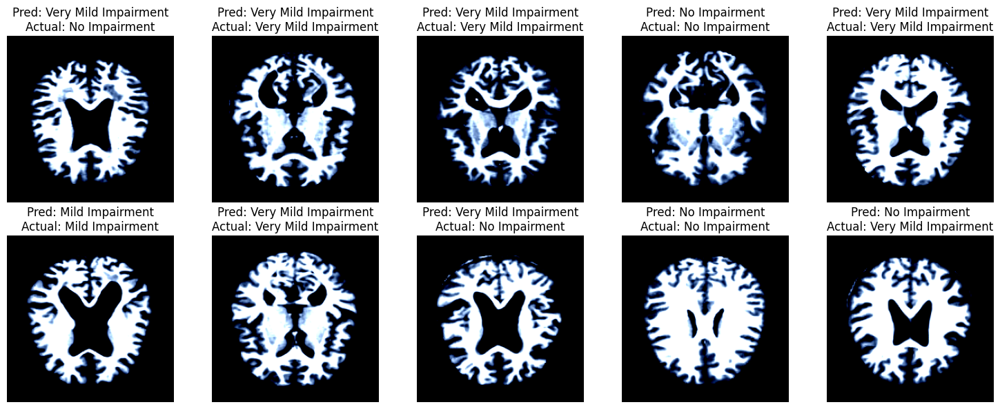

Epoch 11/20: 100%|██████████| 320/320 [06:16<00:00,  1.18s/it]


Epoch 11/20:
  LR: 0.000075
  Training Loss: 0.1367, Training Acc: 96.01%
  Testing Loss: 0.5322, Testing Acc: 81.16%


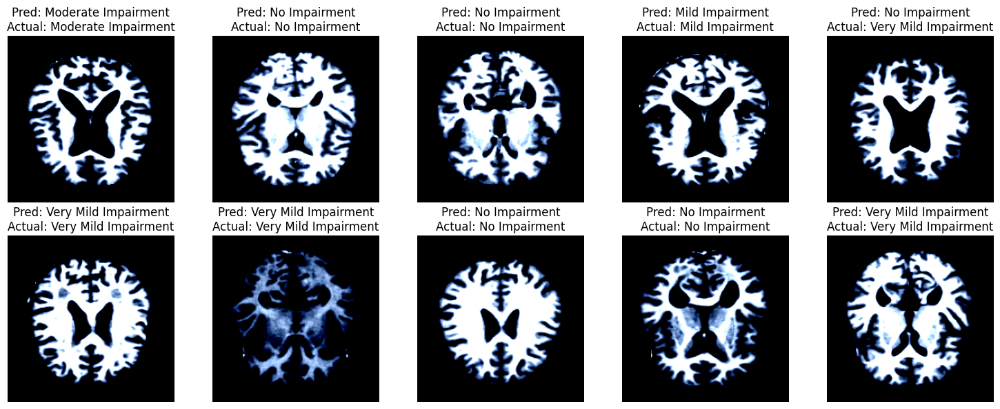

Epoch 12/20: 100%|██████████| 320/320 [06:16<00:00,  1.18s/it]


Epoch 12/20:
  LR: 0.000065
  Training Loss: 0.0720, Training Acc: 98.76%
  Testing Loss: 0.4353, Testing Acc: 85.54%


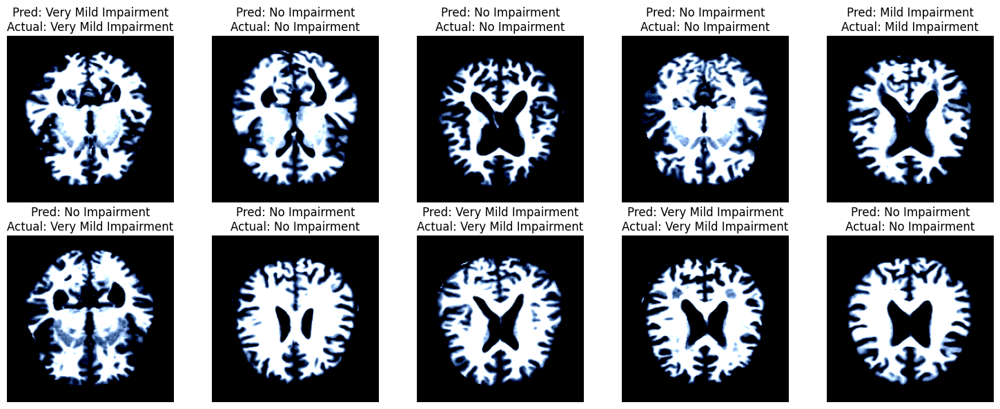

Epoch 13/20: 100%|██████████| 320/320 [06:17<00:00,  1.18s/it]


Epoch 13/20:
  LR: 0.000055
  Training Loss: 0.0611, Training Acc: 99.22%
  Testing Loss: 0.3680, Testing Acc: 87.41%


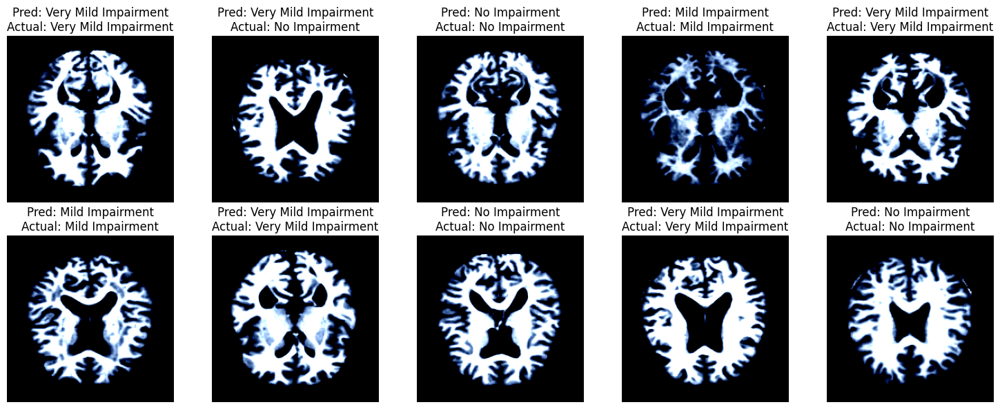

Epoch 14/20: 100%|██████████| 320/320 [06:17<00:00,  1.18s/it]


Epoch 14/20:
  LR: 0.000045
  Training Loss: 0.0321, Training Acc: 98.91%
  Testing Loss: 0.5086, Testing Acc: 85.61%


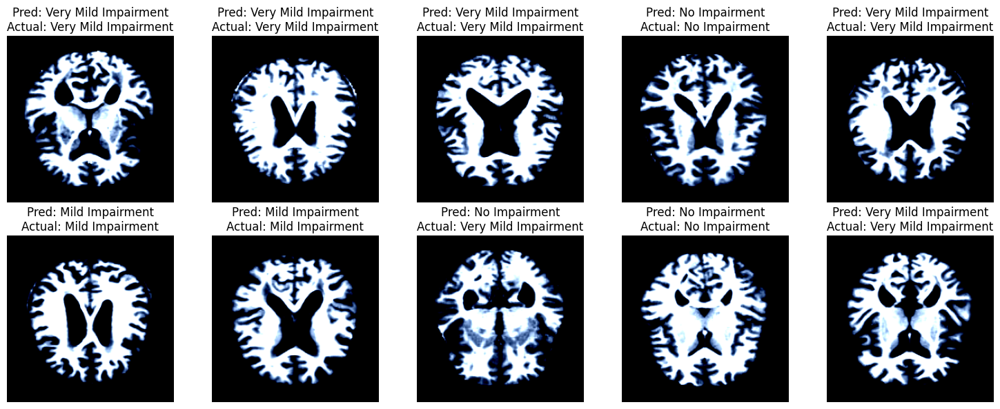

Epoch 15/20: 100%|██████████| 320/320 [06:16<00:00,  1.18s/it]


Epoch 15/20:
  LR: 0.000035
  Training Loss: 0.0132, Training Acc: 99.75%
  Testing Loss: 0.3559, Testing Acc: 89.91%


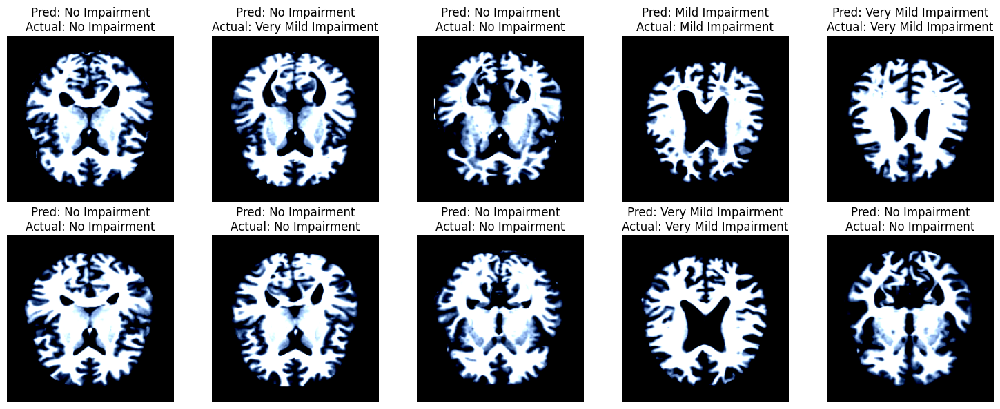

Epoch 16/20: 100%|██████████| 320/320 [06:17<00:00,  1.18s/it]


Epoch 16/20:
  LR: 0.000025
  Training Loss: 0.0041, Training Acc: 99.99%
  Testing Loss: 0.2997, Testing Acc: 91.63%


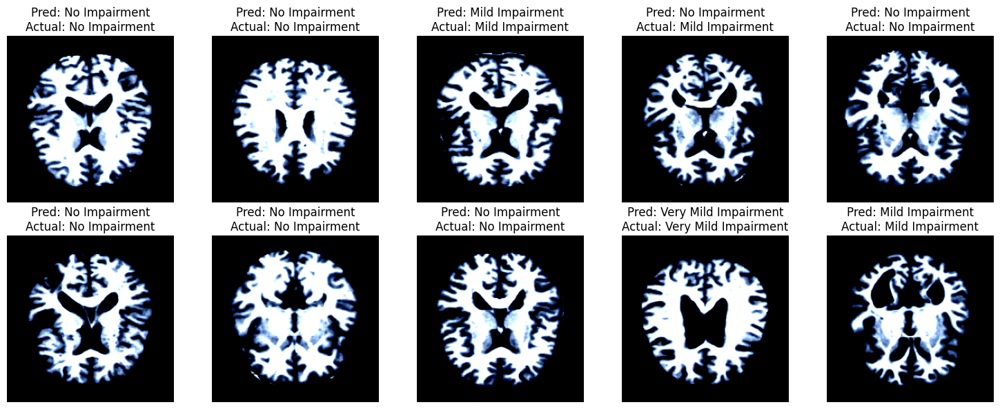

Epoch 17/20: 100%|██████████| 320/320 [06:17<00:00,  1.18s/it]


Epoch 17/20:
  LR: 0.000017
  Training Loss: 0.0003, Training Acc: 100.00%
  Testing Loss: 0.3105, Testing Acc: 92.10%


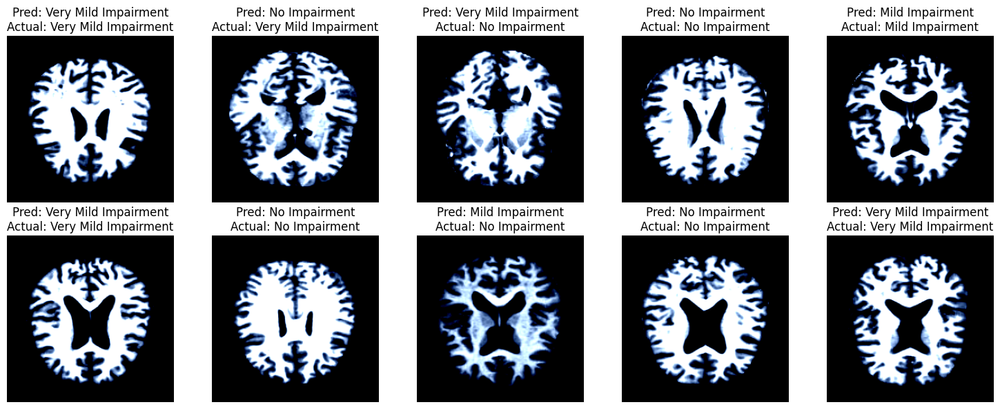

Epoch 18/20: 100%|██████████| 320/320 [06:17<00:00,  1.18s/it]


Epoch 18/20:
  LR: 0.000010
  Training Loss: 0.0001, Training Acc: 100.00%
  Testing Loss: 0.3116, Testing Acc: 92.26%


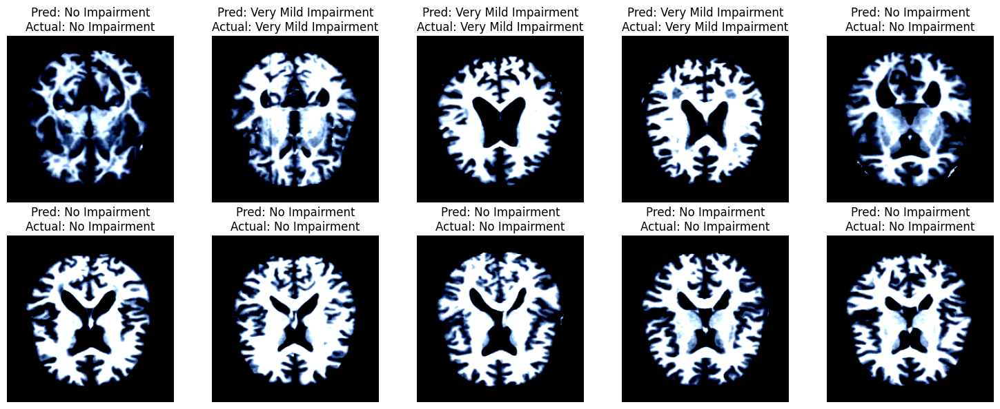

Epoch 19/20: 100%|██████████| 320/320 [06:17<00:00,  1.18s/it]


Epoch 19/20:
  LR: 0.000004
  Training Loss: 0.0001, Training Acc: 100.00%
  Testing Loss: 0.3140, Testing Acc: 92.42%


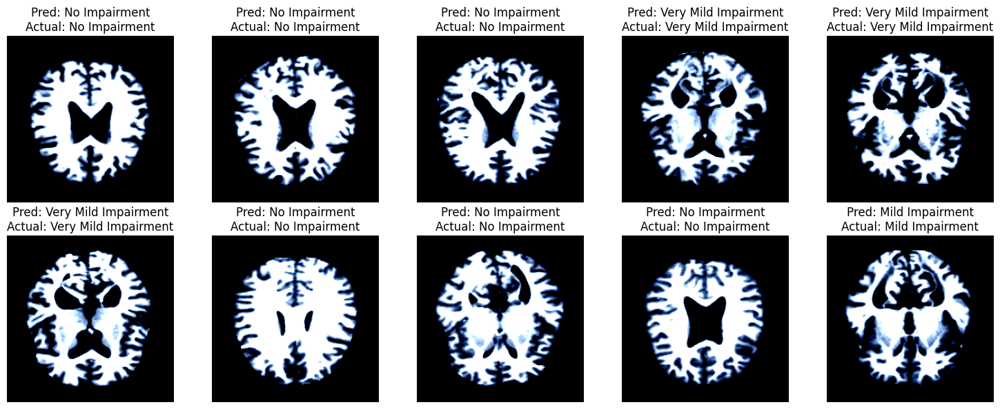

Epoch 20/20: 100%|██████████| 320/320 [06:17<00:00,  1.18s/it]


Epoch 20/20:
  LR: 0.000001
  Training Loss: 0.0001, Training Acc: 100.00%
  Testing Loss: 0.3148, Testing Acc: 92.42%


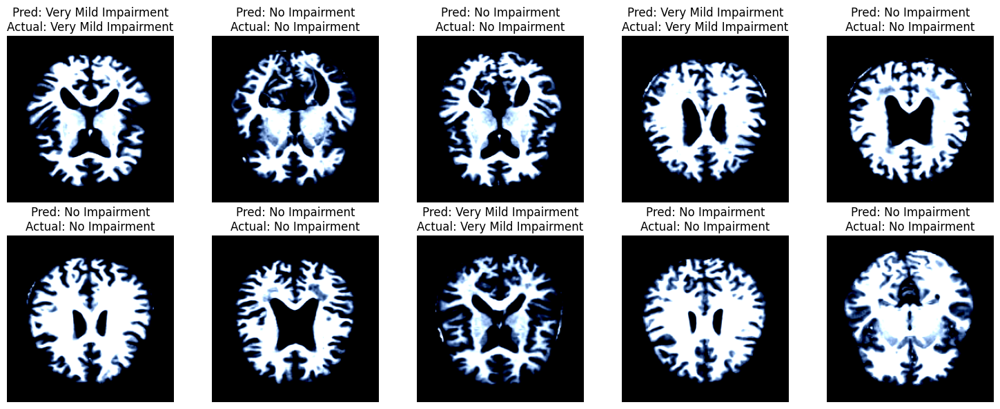

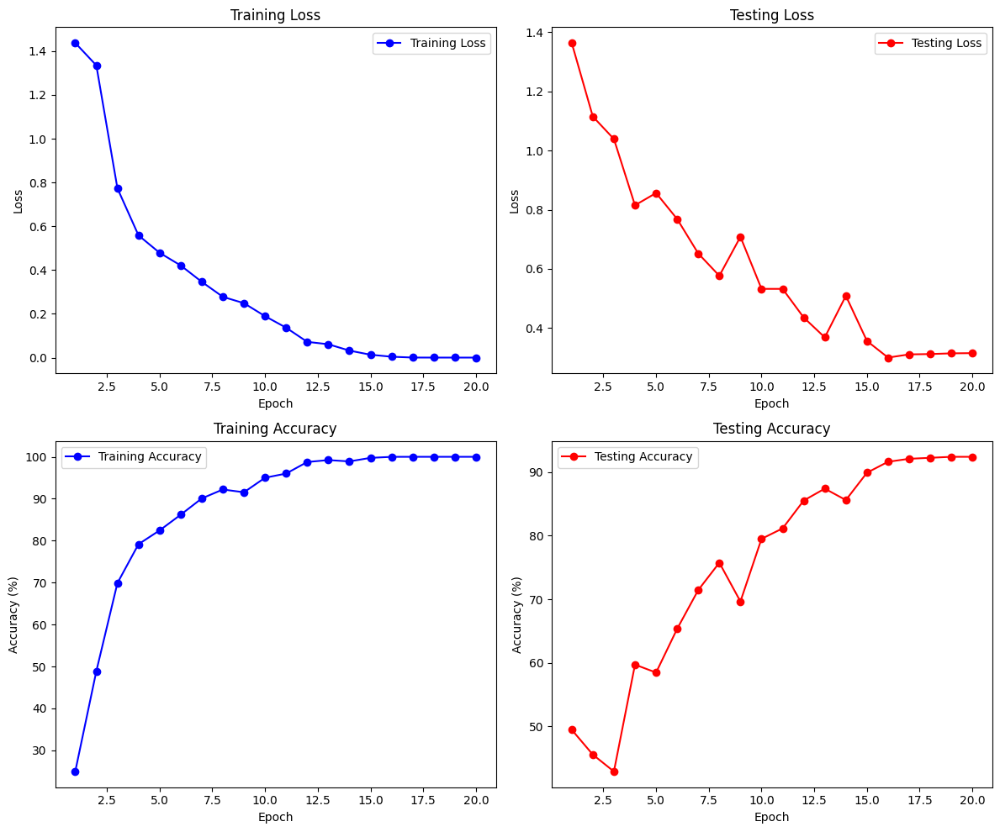

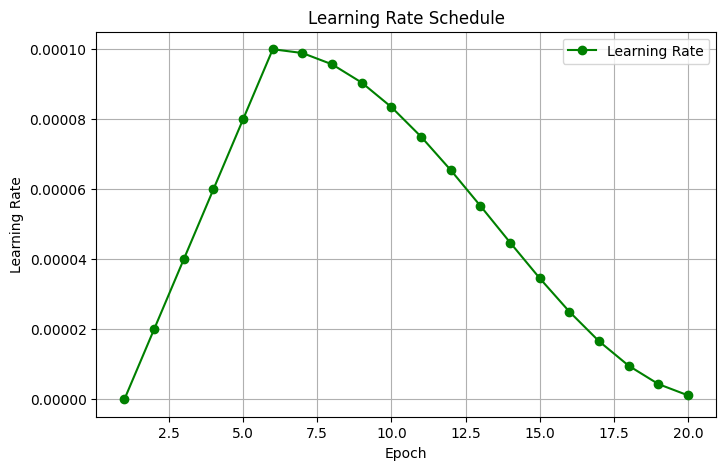

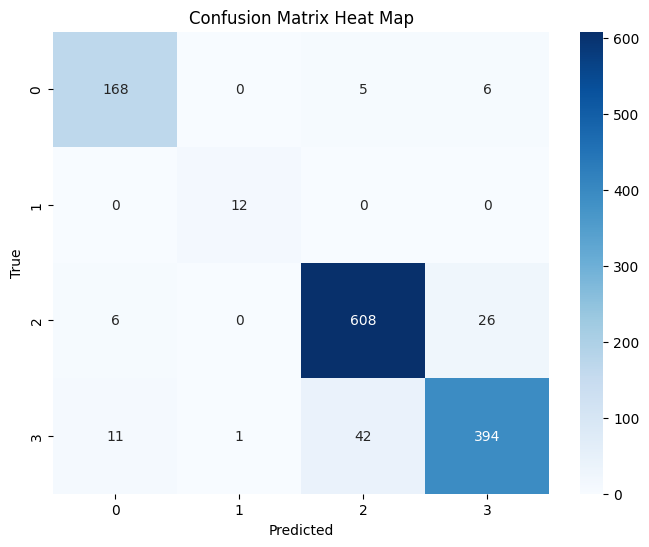

In [18]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix

# Learning rate scheduler

def evaluate(loader):
    """Evaluate model and return loss, accuracy, and all true/predicted labels."""
    model.eval()
    total_loss = 0.0
    correct = 0
    total = 0
    all_labels = []
    all_preds = []
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            outputs = model(images)
            loss = criterion(outputs, labels)
            total_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())
    avg_loss = total_loss / total
    accuracy = (correct / total) * 100
    return avg_loss, accuracy, np.array(all_labels), np.array(all_preds)

def train():
    train_losses = []
    test_losses = []
    train_accs = []
    test_accs = []
    lr_rates = []
    final_y_true = None
    final_y_pred = None

    for epoch in range(EPOCHS):
        model.train()
        running_loss = 0.0

        # Training loop
        for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS}", leave=True):
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * images.size(0)

        # Compute average training loss
        epoch_train_loss = running_loss / len(train_dataset)
        train_losses.append(epoch_train_loss)

        # Evaluate on train and test sets
        train_loss, train_acc, _, _ = evaluate(train_loader)
        train_accs.append(train_acc)
        test_loss, test_acc, y_true, y_pred = evaluate(test_loader)
        test_losses.append(test_loss)
        test_accs.append(test_acc)
        final_y_true = y_true
        final_y_pred = y_pred

        # Record learning rate
        current_lr = optimizer.param_groups[0]['lr']
        lr_rates.append(current_lr)

        # Step the scheduler
        scheduler.step()

        print(f"Epoch {epoch+1}/{EPOCHS}:")
        print(f"  LR: {current_lr:.6f}")
        print(f"  Training Loss: {epoch_train_loss:.4f}, Training Acc: {train_acc:.2f}%")
        print(f"  Testing Loss: {test_loss:.4f}, Testing Acc: {test_acc:.2f}%")

        show_predictions(model, test_loader, train_dataset.classes, DEVICE)

    # Plot the training metrics over epochs
    epochs = range(1, EPOCHS+1)
    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    axs[0, 0].plot(epochs, train_losses, 'b-o', label="Training Loss")
    axs[0, 0].set_title("Training Loss")
    axs[0, 0].set_xlabel("Epoch")
    axs[0, 0].set_ylabel("Loss")
    axs[0, 0].legend()

    axs[0, 1].plot(epochs, test_losses, 'r-o', label="Testing Loss")
    axs[0, 1].set_title("Testing Loss")
    axs[0, 1].set_xlabel("Epoch")
    axs[0, 1].set_ylabel("Loss")
    axs[0, 1].legend()

    axs[1, 0].plot(epochs, train_accs, 'b-o', label="Training Accuracy")
    axs[1, 0].set_title("Training Accuracy")
    axs[1, 0].set_xlabel("Epoch")
    axs[1, 0].set_ylabel("Accuracy (%)")
    axs[1, 0].legend()

    axs[1, 1].plot(epochs, test_accs, 'r-o', label="Testing Accuracy")
    axs[1, 1].set_title("Testing Accuracy")
    axs[1, 1].set_xlabel("Epoch")
    axs[1, 1].set_ylabel("Accuracy (%)")
    axs[1, 1].legend()

    plt.tight_layout()
    plt.show()

    # Separate Learning Rate Curve Plot
    plt.figure(figsize=(8, 5))
    plt.plot(epochs, lr_rates, 'g-o', label="Learning Rate")
    plt.title("Learning Rate Schedule")
    plt.xlabel("Epoch")
    plt.ylabel("Learning Rate")
    plt.legend()
    plt.grid()
    plt.show()

    # Confusion Matrix Heat Map
    cm = confusion_matrix(final_y_true, final_y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix Heat Map")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

# Run training
train()
